In [1]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc

import time

t = !pwd
t = t[0]
%cd /mnt/win1/
from SC2Spa import SI, SVA, Vis, PP
%cd $t

/mnt/win1
/mnt/win1/SC2Spa_Notebook/MouseHippocampus_SSV2


# Load

In [2]:
adata = ad.read_h5ad('../Dataset/AdataMH2.h5ad')
adata.var_names_make_unique()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

'''
model = SI.Self_Mapping(adata, sparse = True, model_path = None, x_name = 'xcoord', y_name = 'ycoord',
                        root = 'Model_SI/', name = 'SI_Overall_HC2', l1_reg = 1e-5, l2_reg = 0,
                        dropout = 0.05, epoch = 500, batch_size = 4096, nodes = [4096, 1024, 256, 64, 16, 4],
                        lrr_patience = 20, ES_patience = 50, min_lr = 1e-5, save = True, polar = True, seed = None)
'''
model = SI.Self_Mapping(adata, sparse = True, model_path = 'Model_SI/SI_Overall_HC2.h5',
                        x_name = 'xcoord', y_name = 'ycoord')

Y = adata.obs[['xcoord', 'ycoord']].values
YNorm = PP.MinMaxNorm(Y, Y)
predNorm = PP.MinMaxNorm(adata.obs[['x_self_transfer', 'y_self_transfer']].values, Y)

SVA.PrioritizeLPG(adata, Model = model, percent = 0.5, scale_factor = 1e3,
                  Norm = True, x_name = 'xcoord', y_name = 'ycoord')

2022-06-14 22:59:34.042371: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-14 22:59:35.124497: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22079 MB memory:  -> device: 0, name: NVIDIA TITAN RTX, pci bus id: 0000:3b:00.0, compute capability: 7.5


<keras.layers.core.dense.Dense object at 0x7f76db0aec70> :
(4, 2)
<keras.layers.core.dense.Dense object at 0x7f76db128e50> :
(16, 4)
<keras.layers.core.dense.Dense object at 0x7f76db128790> :
(64, 16)
<keras.layers.core.dense.Dense object at 0x7f76db122cd0> :
(256, 64)
<keras.layers.core.dense.Dense object at 0x7f7727928e50> :
(1024, 256)
<keras.layers.core.dense.Dense object at 0x7f7727928790> :
(4096, 1024)
<keras.layers.core.dense.Dense object at 0x7f772c532d90> :
(19227, 4096)


In [4]:
adata.var.to_csv('GeneInfo/LPG_HC2.csv')
adata.var.sort_values('imp_sumup_norm', ascending = False)

,n_cells,mt,ERCC,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,imp_sumup,imp_sumup_norm
PCP4,8068,False,False,8068,1.283725,62.170019,27378.0,1.826318,1.731488
KIF5A,11589,False,False,11589,1.191963,45.660430,25421.0,1.225004,1.161397
SPARC,4877,False,False,4877,0.342242,77.132274,7299.0,1.003054,0.950971
CAMK2N1,12213,False,False,12213,1.611338,42.734562,34365.0,0.996083,0.944362
CAMK2A,9083,False,False,9083,0.926806,57.410794,19766.0,0.979080,0.928243
...,...,...,...,...,...,...,...,...,...
D130051D11RIK,5,False,False,5,0.000234,99.976556,5.0,0.002166,0.002053
4732456N10RIK,4,False,False,4,0.000188,99.981244,4.0,0.002159,0.002046
SLC6A16,3,False,False,3,0.000141,99.985933,3.0,0.002158,0.002046
BARHL2,3,False,False,3,0.000141,99.985933,3.0,0.002152,0.002040


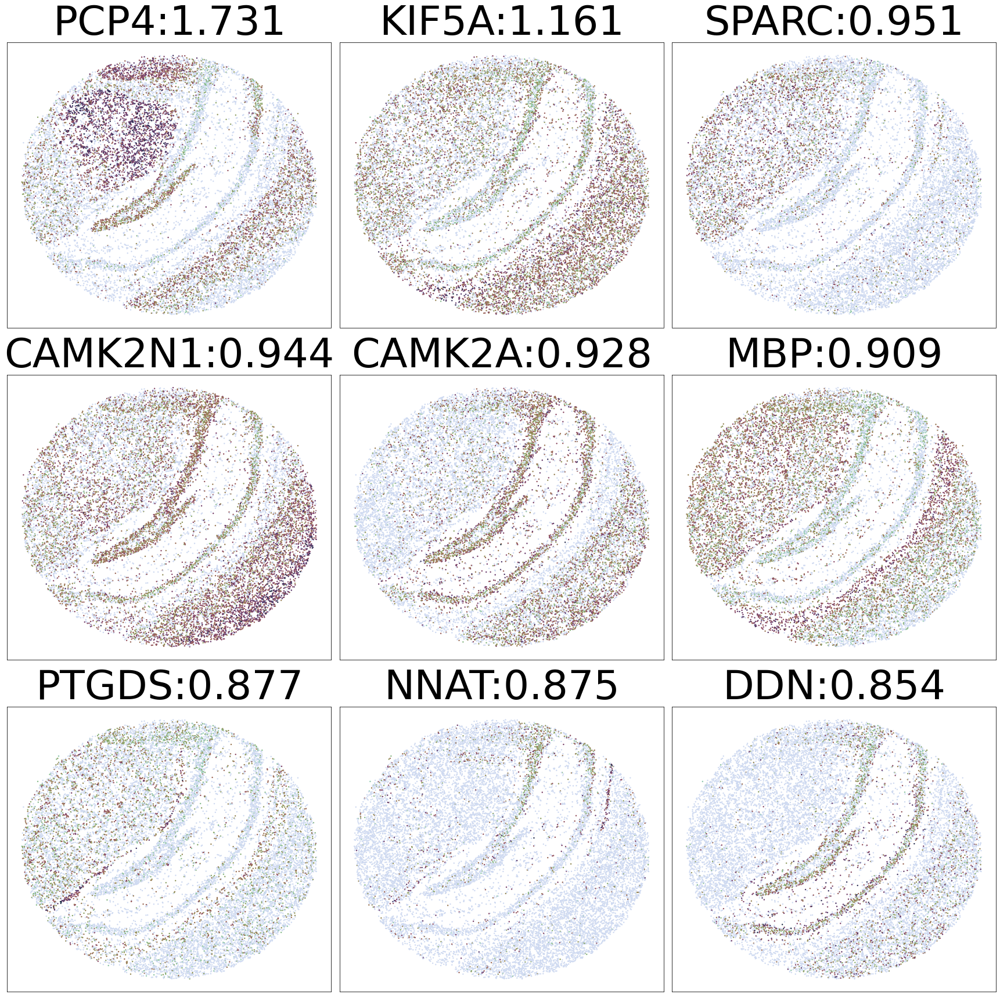

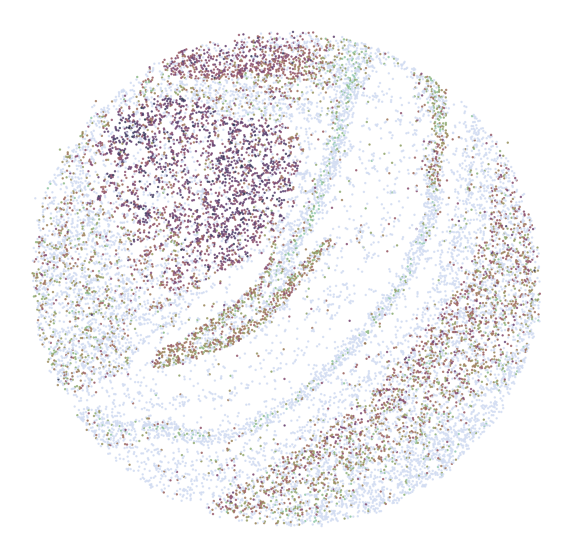

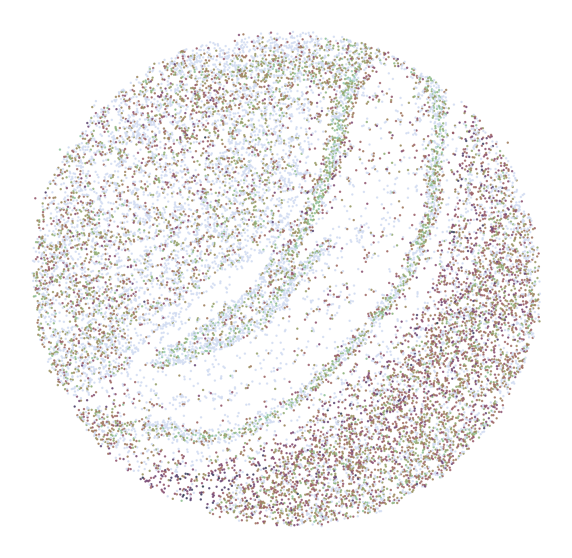

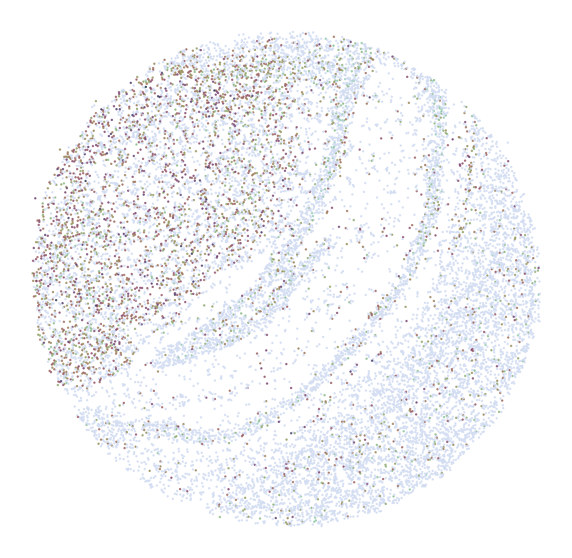

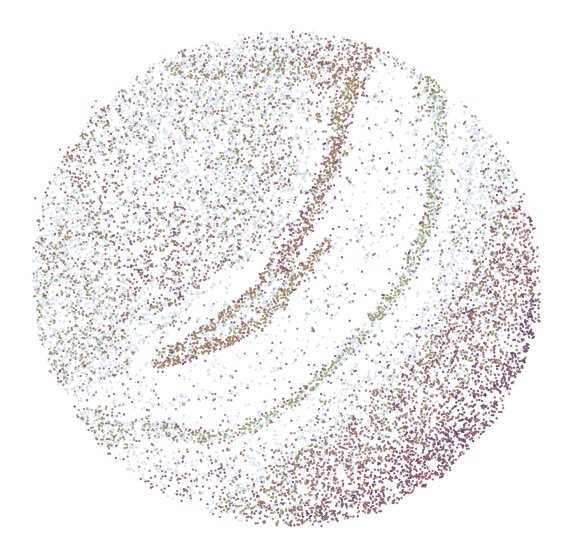

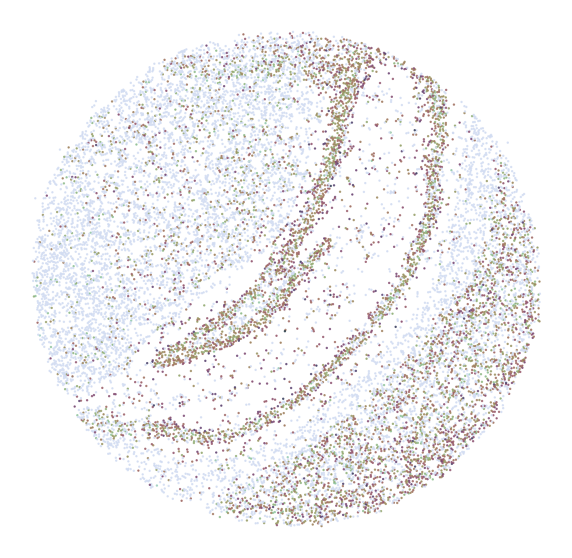

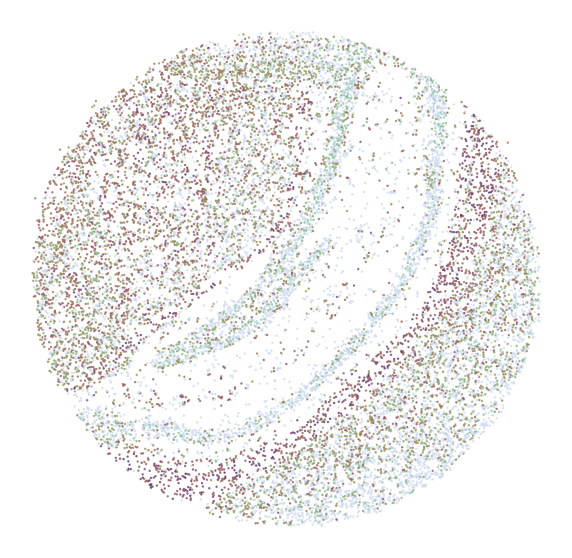

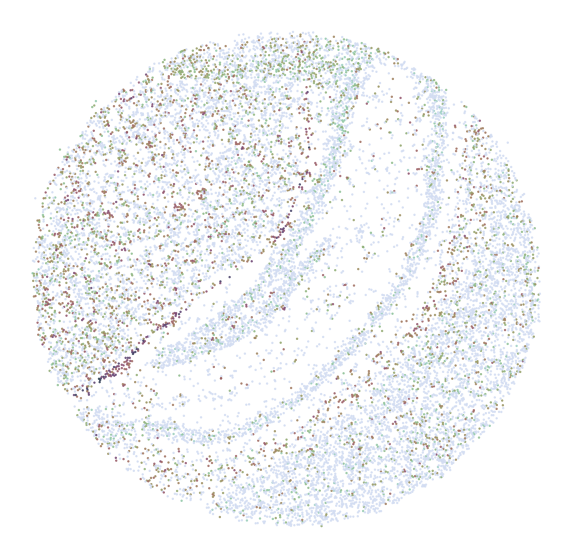

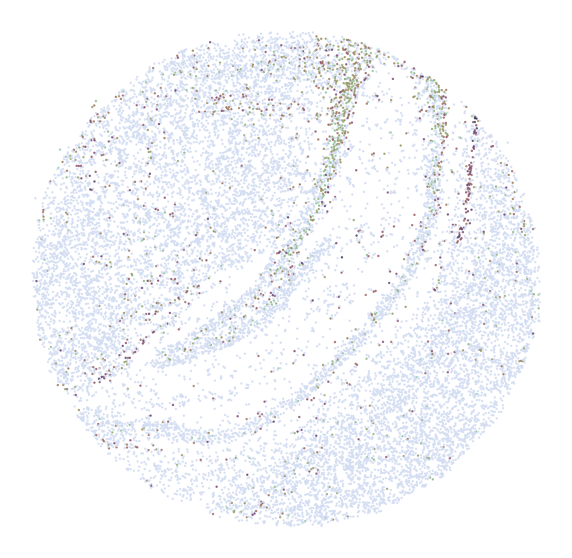

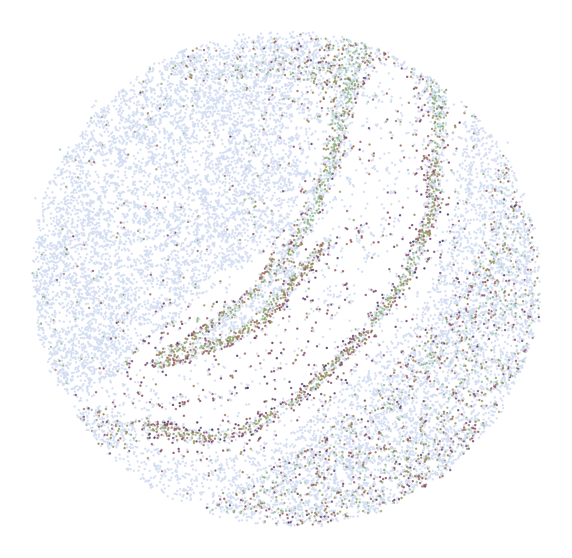

In [3]:
cmap = sns.cubehelix_palette(n_colors = 32,start = 2, rot=1.5, as_cmap = True)

Vis.DrawSVG(adata, adata.var, 'imp_sumup_norm', n_genes = 9, cmap = cmap,
              FM = False, root = 'figures/SVG_HC2/', fontsize = 70,
              Bottom = False, output = 'SlideSeq2FCNNTop_HC2')

In [10]:
root = 'figures/SVG_HC2/'
if not os.path.exists(root):
    os.makedirs(root)

In [7]:
adata.var

,n_cells,mt,ERCC,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,imp_sumup,imp_sumup_norm
0610007P14RIK,806,False,False,806,0.040840,96.220753,871.0,0.054413,0.046363
0610009B22RIK,587,False,False,587,0.029352,97.247620,626.0,0.036655,0.031233
0610009E02RIK,30,False,False,30,0.001407,99.859333,30.0,0.003178,0.002708
0610009L18RIK,164,False,False,164,0.007924,99.231022,169.0,0.005325,0.004537
0610009O20RIK,263,False,False,263,0.012801,98.766821,273.0,0.022677,0.019322
...,...,...,...,...,...,...,...,...,...
MT-TR,55,True,False,55,0.002579,99.742111,55.0,0.003349,0.002853
MT-TS2,326,True,False,326,0.015567,98.471421,332.0,0.024797,0.021129
MT-TT,42,True,False,42,0.002016,99.803067,43.0,0.003606,0.003073
MT-TV,846,True,False,846,0.041309,96.033197,881.0,0.260510,0.221969


In [4]:
adata = ad.read_h5ad('../Dataset/AdataMH2.h5ad')
adata.var_names_make_unique()

adata.X = adata.X / adata.X.sum(axis = 1) * 1e4

X = adata.X
Y = adata.obs[['xcoord', 'ycoord']].values

RTheta = PolarTrans(Y)
RThetaNorm = MinMaxNorm(RTheta, RTheta)

# Train

In [6]:
sta = time.time()

model = Train(X, RThetaNorm, root = 'Model_SI/',
              name = 'SI_Overall_HC2', l1_reg = 1e-7, l2_reg = 0,
              dropout = 0, epoch = 500,
              batch_size = 1024, nodes = [4096, 1024, 256, 64, 16, 4])

end = time.time()
print((end - sta) / 60.0, 'min')

C:\Users\nrx398\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/500
15/15 [==============================] - 7s 185ms/step - loss: 0.2601 - rmse: 0.1908
Epoch 2/500
15/15 [==============================] - 3s 169ms/step - loss: 0.2090 - rmse: 0.1382
Epoch 3/500
15/15 [==============================] - 3s 169ms/step - loss: 0.1799 - rmse: 0.1103
Epoch 4/500
15/15 [==============================] - 3s 168ms/step - loss: 0.1592 - rmse: 0.0920
Epoch 5/500
15/15 [==============================] - 3s 170ms/step - loss: 0.1456 - rmse: 0.0808
Epoch 6/500
15/15 [==============================] - 3s 168ms/step - loss: 0.1348 - rmse: 0.0721
Epoch 7/500
15/15 [==============================] - 3s 164ms/step - loss: 0.1263 - rmse: 0.0655
Epoch 8/500
15/15 [==============================] - 3s 169ms/step - loss: 0.1189 - rmse: 0.0598
Epoch 9/500
15/15 [==============================] - 3s 168ms/step - loss: 0.1133 - rmse: 0.0556
Epoch 10/500
15/15 [==============================] - 3s 172ms/step - loss: 0.1082 - rmse: 0.0518
Epoch 11/500
15/15 [=========

15/15 [==============================] - 3s 165ms/step - loss: 0.0346 - rmse: 0.0109
Epoch 151/500
15/15 [==============================] - 3s 165ms/step - loss: 0.0351 - rmse: 0.0114
Epoch 152/500
15/15 [==============================] - 3s 165ms/step - loss: 0.0356 - rmse: 0.0119
Epoch 153/500
15/15 [==============================] - 3s 166ms/step - loss: 0.0352 - rmse: 0.0116
Epoch 154/500
15/15 [==============================] - 3s 169ms/step - loss: 0.0357 - rmse: 0.0121
Epoch 155/500
15/15 [==============================] - 3s 170ms/step - loss: 0.0347 - rmse: 0.0111
Epoch 156/500
15/15 [==============================] - 3s 165ms/step - loss: 0.0358 - rmse: 0.0121
Epoch 157/500
15/15 [==============================] - 3s 167ms/step - loss: 0.0348 - rmse: 0.0111
Epoch 158/500
15/15 [==============================] - 3s 164ms/step - loss: 0.0351 - rmse: 0.0114
Epoch 159/500
15/15 [==============================] - 3s 167ms/step - loss: 0.0353 - rmse: 0.0116
Epoch 160/500
15/15 [===

# Visualize

In [5]:
cname = 'leiden'
root = 'figures/'

model = load_model('Model_SI/SI_Overall_HC2.h5', compile = False)

2022-04-07 17:58:56.460815: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-04-07 17:58:57.131232: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22254 MB memory:  -> device: 0, name: NVIDIA TITAN RTX, pci bus id: 0000:3b:00.0, compute capability: 7.5


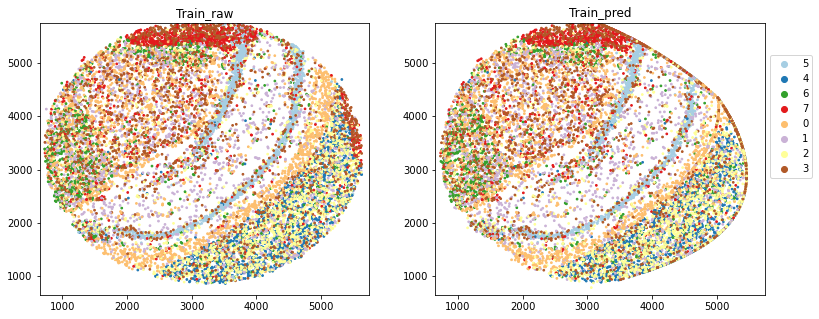

In [18]:
train_pred = model.predict(X)

CTs = adata.obs[cname].value_counts()

SelectedCTs = CTs.index.tolist()[:8]

t = adata
Select = t.obs[cname].apply(lambda x: x in SelectedCTs).astype(bool)
t = t[Select]

#Y_pred = ReMMNorm(Y, train_pred)
Y_pred = RePolarTrans(ReMMNorm(RTheta, train_pred))

color_dic = {}
for i, ct in enumerate(t.obs[cname].unique()):
    color_dic[ct] = i

color = list(map(lambda x: color_dic[x], t.obs[cname]))

fig, axes = plt.subplots(1,2, figsize=(13,5))

scatter = axes[0].scatter(t.obs['xcoord'],\
                      t.obs['ycoord'],\
                      s = 3,\
                      c = color,\
                      cmap = plt.get_cmap('Paired'))
plt.grid(b=None)

i=0
scatter = axes[1].scatter(Y_pred[Select, 0],\
                          Y_pred[Select, 1],\
                          s = 3,\
                          c = color,\
                          cmap = plt.get_cmap('Paired'))

plt.grid(b=None)
#plt.axis('off')

axes[0].title.set_text('Train_raw')
axes[1].title.set_text('Train_pred')

axes[0].set_xlim([650, 5750])
axes[0].set_ylim([650, 5750])
axes[1].set_xlim([650, 5750])
axes[1].set_ylim([650, 5750])

plt.legend(handles=scatter.legend_elements()[0],
           labels = list(t.obs[cname].unique()),
           bbox_to_anchor=(1, 0.9))
plt.savefig(root + 'train_HC2_overall_1.pdf', bbox_inches='tight')
plt.show()

# Aggerate weight matrices

In [6]:
cmap = sns.cubehelix_palette(n_colors = 32,start = 2, rot=1.5, as_cmap = True)

def SelectFeatures(array_in, percent = 0.5):
    t = array_in > np.quantile(array_in, percent, axis = 0)
    return t

def SelectGenes(Weights, percent = 0.5):
    
    t = Weights[0].sum(axis =0) > 0
    for j in range(len(Weights)):
        imp_sumup = Weights[j][:, t].sum(axis = 1)
        t = SelectFeatures(imp_sumup, percent = percent)
    return imp_sumup, t

def DrawGenes(adata, GeneList, target_field, CT = '', Bottom = False, output = ''):
    
    if(CT != ''):
        adata = adata[adata.obs['MCT'] == CT]
    
    GeneList = GeneList.sort_values(target_field, ascending=Bottom)
    Genes = GeneList.index.tolist()
    fig, axes = plt.subplots(4, 4, figsize = (40, 32))

    for i in range(16):
        
        im = axes[i // 4][i % 4].scatter(adata.obs['xcoord'],\
                                         adata.obs['ycoord'],\
                                         s = 2,\
                                         c = adata[:, Genes[i]].X.toarray().flatten(),\
                                         cmap = cmap)

        axes[i//4][i%4].set_title(Genes[i] + ':' + "%.3f"%GeneList['imp_sumup_norm'][i], fontsize=40)
        axes[i//4][i%4].get_xaxis().set_visible(False)
        axes[i//4][i%4].get_yaxis().set_visible(False)
        
        #axes[i//4][i%4].set_xlim([650, 5750])
        #axes[i//4][i%4].set_ylim([650, 5750])
        fig.colorbar(im, ax= axes[i//4][i%4])

    '''
    fig.suptitle('Top Contributed Genes',
                 fontsize = 24,
                 horizontalalignment = 'center',
                 y = 1.03)
    '''
    
    plt.tight_layout()
    plt.savefig(save_root + output + '.png', )

In [7]:
train_pred = model.predict(X)
Y_pred = RePolarTrans(ReMMNorm(RTheta, train_pred))

predNorm = MinMaxNorm(Y_pred, Y)
YNorm = MinMaxNorm(Y, Y)

Pearsonr_x = stats.pearsonr(YNorm[:, 0], predNorm[:, 0])[0]
Pearsonr_y = stats.pearsonr(YNorm[:, 1], predNorm[:, 1])[0]
Pearsonr_ave = (Pearsonr_x + Pearsonr_y)/2

r2 = r2_score(YNorm, predNorm, multioutput='variance_weighted')

In [8]:
DLNN_layers = model.layers[::-1]
#DLNN_layers.reverse()

Weights = []

for layer in DLNN_layers:
    t = layer.get_weights()
    if((len(t) > 0)&(len(t) < 4)):
        print(layer, ':')
        print(t[0].shape)
        Weights.append(np.abs(t[0]))

<keras.layers.core.dense.Dense object at 0x7f0075e7d850> :
(4, 2)
<keras.layers.core.dense.Dense object at 0x7f0075e78df0> :
(16, 4)
<keras.layers.core.dense.Dense object at 0x7f0075ef2f70> :
(64, 16)
<keras.layers.core.dense.Dense object at 0x7f0075ef28b0> :
(256, 64)
<keras.layers.core.dense.Dense object at 0x7f0075ec5df0> :
(1024, 256)
<keras.layers.core.dense.Dense object at 0x7f0071b10f70> :
(4096, 1024)
<keras.layers.core.dense.Dense object at 0x7f0071b10970> :
(19227, 4096)


In [9]:
scale_factor = 1e3

imp_sumup, label = SelectGenes(Weights)
GeneInfo = adata.var
GeneInfo['imp_sumup'] = imp_sumup
GeneInfo['imp_sumup_norm'] = GeneInfo['imp_sumup'] / GeneInfo['imp_sumup'].sum() * Pearsonr_ave * 1e3

In [10]:
GeneInfo = GeneInfo.sort_values('imp_sumup_norm', ascending = False)
GeneInfo.to_csv('GeneInfo_HC2_v1.csv')
GeneInfo

,n_cells,mt,ERCC,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,imp_sumup,imp_sumup_norm
CRYM,2266,False,False,2266,0.234726,89.374971,5006.0,3.260406e+01,3.298040e-01
PCP4,8068,False,False,8068,1.283725,62.170019,27378.0,2.794515e+01,2.826771e-01
CAMK2N1,12213,False,False,12213,1.611338,42.734562,34365.0,2.780505e+01,2.812600e-01
NNAT,1966,False,False,1966,0.136165,90.781638,2904.0,2.725760e+01,2.757223e-01
KIF5A,11589,False,False,11589,1.191963,45.660430,25421.0,2.605301e+01,2.635373e-01
...,...,...,...,...,...,...,...,...,...
CDX1,3,False,False,3,0.000141,99.985933,3.0,1.207873e-07,1.221815e-09
C330019F10RIK,3,False,False,3,0.000141,99.985933,3.0,1.187604e-07,1.201312e-09
HEPHL1,3,False,False,3,0.000141,99.985933,3.0,1.170536e-07,1.184046e-09
1700001C19RIK,4,False,False,4,0.000188,99.981244,4.0,1.154627e-07,1.167954e-09


In [11]:
adata.X = np.log(adata.X + 1)

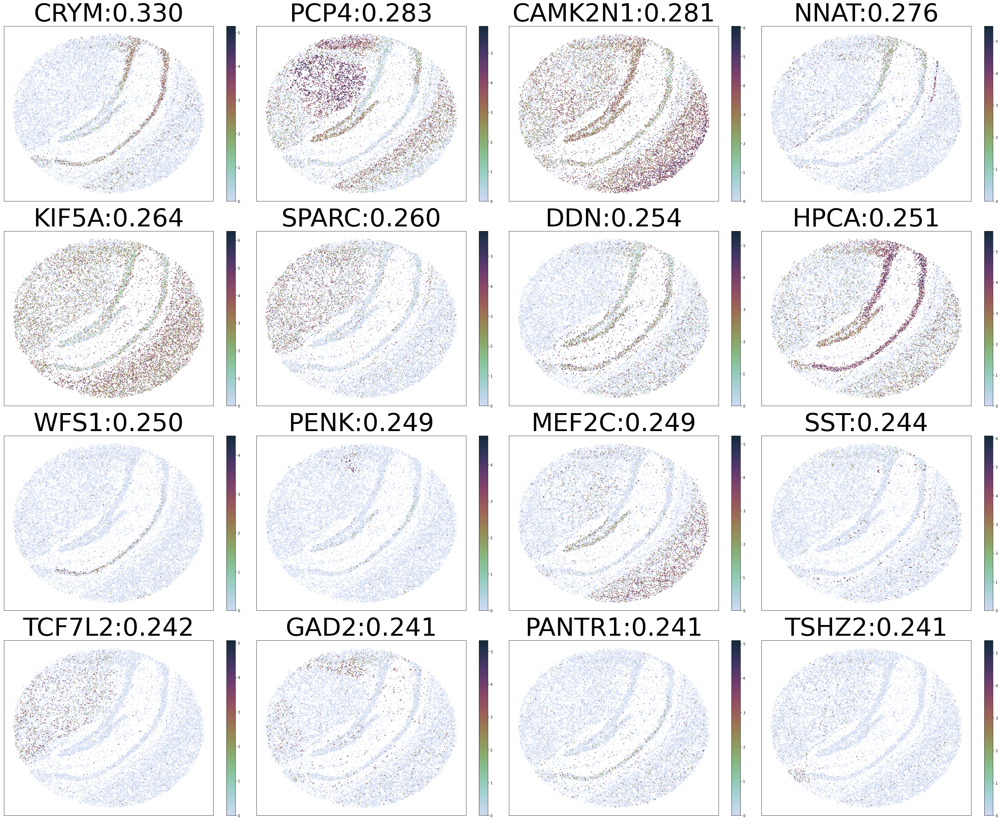

In [12]:
cmap = sns.cubehelix_palette(n_colors = 32,start = 2, rot=1.5, as_cmap = True)

Vis.DrawGenes(adata, GeneInfo, 'imp_sumup', cmap = cmap, root = 'figures/SVG/',
              fontsize = 70, Bottom = False, output = 'SlideSeq2FCNNTop_HC2')